In [1]:
import torch
import torch.nn as nn
import torchvision
import torch.nn.functional as F
import numpy as np 
from matplotlib import pyplot as plt
import torchvision.transforms as transforms
import torch.optim as optim
from torch.utils.data import random_split
from torchvision import models,datasets
import os
from torch.utils.data import Dataset, DataLoader, ConcatDataset
from PIL import Image

In [2]:
USE_GPU = True

if USE_GPU and torch.cuda.is_available():
    print('using device: cuda')
else:
    print('using device: cpu')

device = torch.device("cuda:0" if USE_GPU else "cpu")

using device: cuda


In [3]:
#Hyperparamters
BATCH_SIZE = 64

In [4]:
train_transform = transforms.Compose([
        transforms.Resize((64,64)),
        #transforms.RandomResizedCrop(224),
        #transforms.RandomHorizontalFlip(),
        #transforms.ColorJitter(),
        transforms.ToTensor(),
        transforms.Normalize([0.5,0.5,0.5], [0.5,0.5,0.5])
])

test_transform = transforms.Compose([
        transforms.Resize((64,64)),
        #transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize([0.5], [0.5])
    ])

In [5]:
class Faces(Dataset):
    def __init__(self, filelist,directory,transform = None):
        self.filelist = filelist
        self.directory = directory
        self.transform = transform
        
    def __len__(self):
        return len(self.filelist)
    
    def __getitem__(self,idx):
        img =  Image.open(os.path.join(self.directory, self.filelist[idx]))
        img = img.convert('RGB')
        img = self.transform(img)
        
        return img
        

In [6]:
train_dir = "../input/celeba-dataset/img_align_celeba/img_align_celeba"
filelist = os.listdir(train_dir)
train_ds = Faces(filelist, train_dir, train_transform)
print(len(train_ds))
train_loader = torch.utils.data.DataLoader(dataset=train_ds,
                                           batch_size=BATCH_SIZE, 
                                           shuffle=True)

202599


In [7]:
i = next(iter(train_loader))
print(i.shape)

torch.Size([64, 3, 64, 64])


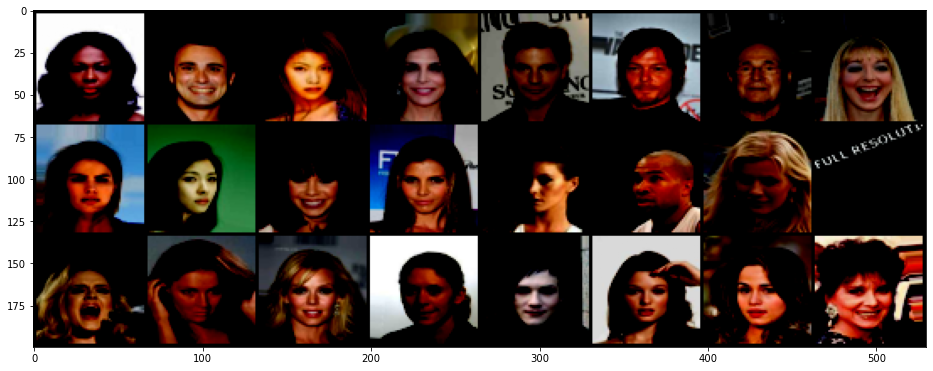

In [8]:
import matplotlib.pyplot as plt
import numpy
samples = iter(train_loader).next()
plt.figure(figsize=(16,24))
grid_imgs = torchvision.utils.make_grid(samples[:24])
np_grid_imgs = grid_imgs.numpy()
# in tensor, image is (batch, width, height), so you have to transpose it to (width, height, batch) in numpy to show it.
plt.imshow(numpy.transpose(np_grid_imgs, (1,2,0)))

In [9]:
class Generator(nn.Module):
    def __init__(self,z_dim,image_dim):
        super(Generator, self).__init__()
        self.deconv1 = nn.ConvTranspose2d(z_dim,image_dim*8,4,1,0)
        self.deconv1_bn = nn.BatchNorm2d(image_dim*8)
        self.deconv2 = nn.ConvTranspose2d(image_dim*8,image_dim*4, 4, 2, 1)
        self.deconv2_bn = nn.BatchNorm2d(image_dim*4)
        self.deconv3 = nn.ConvTranspose2d(image_dim*4,image_dim*2, 4, 2, 1)
        self.deconv3_bn = nn.BatchNorm2d(image_dim*2)
        self.deconv4 = nn.ConvTranspose2d(image_dim*2,image_dim, 4, 2, 1)
        self.deconv4_bn = nn.BatchNorm2d(image_dim)
        self.deconv5 = nn.ConvTranspose2d(image_dim, 3, 4, 2, 1)

    def forward(self, input):
        # x = F.relu(self.deconv1(input))
        x = F.leaky_relu(self.deconv1_bn(self.deconv1(input)), 0.2)
        x = F.leaky_relu(self.deconv2_bn(self.deconv2(x)), 0.2)
        x = F.leaky_relu(self.deconv3_bn(self.deconv3(x)), 0.2)
        x = F.leaky_relu(self.deconv4_bn(self.deconv4(x)), 0.2)
        x = torch.tanh(self.deconv5(x))

        return x

class Discriminator(nn.Module):
    def __init__(self,image_dim):
        super(Discriminator, self).__init__()
        self.conv1 = nn.Conv2d(3, image_dim, 4, 2, 1)
        self.conv2 = nn.Conv2d(image_dim, image_dim*2, 2, 1)
        self.conv2_bn = nn.BatchNorm2d(image_dim*2)
        self.conv3 = nn.Conv2d(image_dim*2,image_dim*4, 4, 2, 1)
        self.conv3_bn = nn.BatchNorm2d(image_dim*4)
        self.conv4 = nn.Conv2d(image_dim*4,image_dim*8, 4, 2, 1)
        self.conv4_bn = nn.BatchNorm2d(image_dim*8)
        self.conv5 = nn.Conv2d(image_dim*8, 1, 4, 1, 0)

    def forward(self, input):
        x = F.leaky_relu(self.conv1(input), 0.2)
        x = F.leaky_relu(self.conv2_bn(self.conv2(x)), 0.2)
        x = F.leaky_relu(self.conv3_bn(self.conv3(x)), 0.2)
        x = F.leaky_relu(self.conv4_bn(self.conv4(x)), 0.2)
        x = torch.sigmoid(self.conv5(x))
        return x

In [10]:
#Define loss functions
#prev lr=2e-3
lr = 3e-4
NUM_EPOCHS = 20
z_dim = 128
image_dim = 64

d = Discriminator(image_dim)
d = d.to(device)

g = Generator(z_dim,image_dim)
g = g.to(device)
criterion = nn.BCELoss()
gen_opt = optim.Adam(g.parameters(), lr = lr)
disc_opt = optim.Adam(d.parameters(), lr = lr)
real_label = 0
fake_label = 1


In [11]:
!pip install --upgrade torchsummary
from torchsummary import summary
summary(g,(z_dim,1,1))

You should consider upgrading via the '/opt/conda/bin/python3.7 -m pip install --upgrade pip' command.
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
   ConvTranspose2d-1            [-1, 512, 4, 4]       1,049,088
       BatchNorm2d-2            [-1, 512, 4, 4]           1,024
   ConvTranspose2d-3            [-1, 256, 8, 8]       2,097,408
       BatchNorm2d-4            [-1, 256, 8, 8]             512
   ConvTranspose2d-5          [-1, 128, 16, 16]         524,416
       BatchNorm2d-6          [-1, 128, 16, 16]             256
   ConvTranspose2d-7           [-1, 64, 32, 32]         131,136
       BatchNorm2d-8           [-1, 64, 32, 32]             128
   ConvTranspose2d-9            [-1, 3, 64, 64]           3,075
Total params: 3,807,043
Trainable params: 3,807,043
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.00
Forward/backward pass size (M

torch.Size([64, 3, 64, 64])


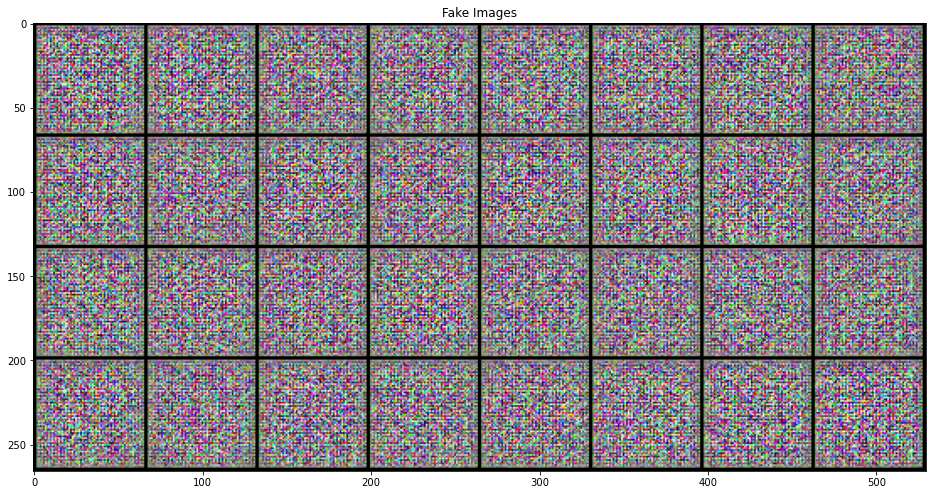

In [12]:
n = torch.randn(BATCH_SIZE, z_dim, 1, 1).to(device)
f = g(n).cpu().detach()
print(f.shape)
plt.figure(figsize=(16,24))
plt.title("Fake Images")
img_grid = torchvision.utils.make_grid(f[0:32],normalize = True)
plt.imshow(np.transpose(img_grid,(1,2,0)))

100%|██████████| 3166/3166 [26:12<00:00,  2.01it/s, d_loss=tensor(0.4167, device='cuda:0', grad_fn=<DivBackward0>), g_loss=tensor(1.5270, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward>)]


EPOCH 1 / 20
Running Generator Loss : 2.167557696677128
Running Discriminator Loss : 0.38474600945216375


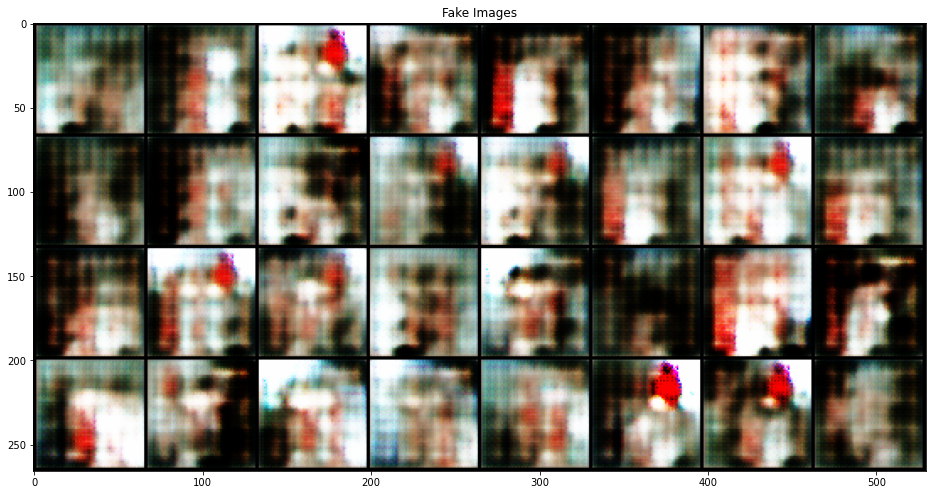

  0%|          | 0/3166 [00:00<?, ?it/s]

EPOCH 2 / 20
Running Generator Loss : 2.0552347956280577
Running Discriminator Loss : 0.4101645762379683


  0%|          | 0/3166 [00:00<?, ?it/s]

EPOCH 3 / 20
Running Generator Loss : 1.9145768927910323
Running Discriminator Loss : 0.4437358771237255


100%|██████████| 3166/3166 [14:22<00:00,  3.67it/s, d_loss=tensor(0.3673, device='cuda:0', grad_fn=<DivBackward0>), g_loss=tensor(1.7059, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward>)]


EPOCH 4 / 20
Running Generator Loss : 1.8523558985185413
Running Discriminator Loss : 0.46347627864558716


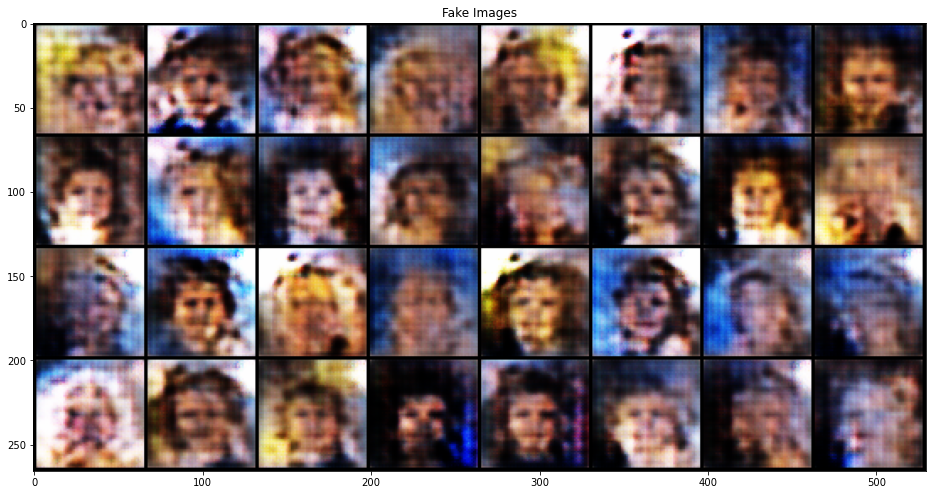

  0%|          | 0/3166 [00:00<?, ?it/s]

EPOCH 5 / 20
Running Generator Loss : 1.8786064079778524
Running Discriminator Loss : 0.4618538519342866


  0%|          | 0/3166 [00:00<?, ?it/s]

EPOCH 6 / 20
Running Generator Loss : 1.8596656954296014
Running Discriminator Loss : 0.46050312234040536


100%|██████████| 3166/3166 [13:51<00:00,  3.81it/s, d_loss=tensor(0.4649, device='cuda:0', grad_fn=<DivBackward0>), g_loss=tensor(1.7173, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward>)]


EPOCH 7 / 20
Running Generator Loss : 1.9335678533256166
Running Discriminator Loss : 0.44588585445493817


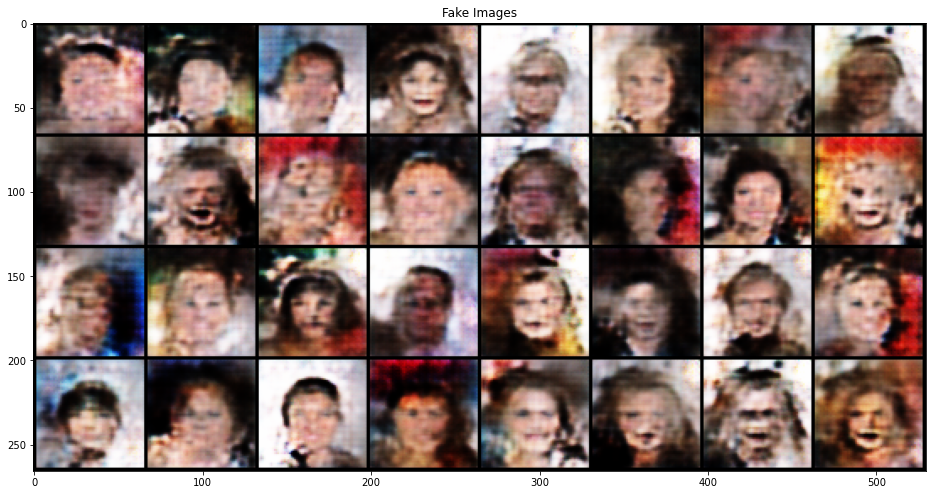

  0%|          | 0/3166 [00:00<?, ?it/s]

EPOCH 8 / 20
Running Generator Loss : 1.971646431760553
Running Discriminator Loss : 0.42109382450015803


  0%|          | 0/3166 [00:00<?, ?it/s]

EPOCH 9 / 20
Running Generator Loss : 2.03457046485143
Running Discriminator Loss : 0.40587729124313504


100%|██████████| 3166/3166 [14:32<00:00,  3.63it/s, d_loss=tensor(0.4072, device='cuda:0', grad_fn=<DivBackward0>), g_loss=tensor(1.8639, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward>)]


EPOCH 10 / 20
Running Generator Loss : 2.0584375107506747
Running Discriminator Loss : 0.3871558455447946


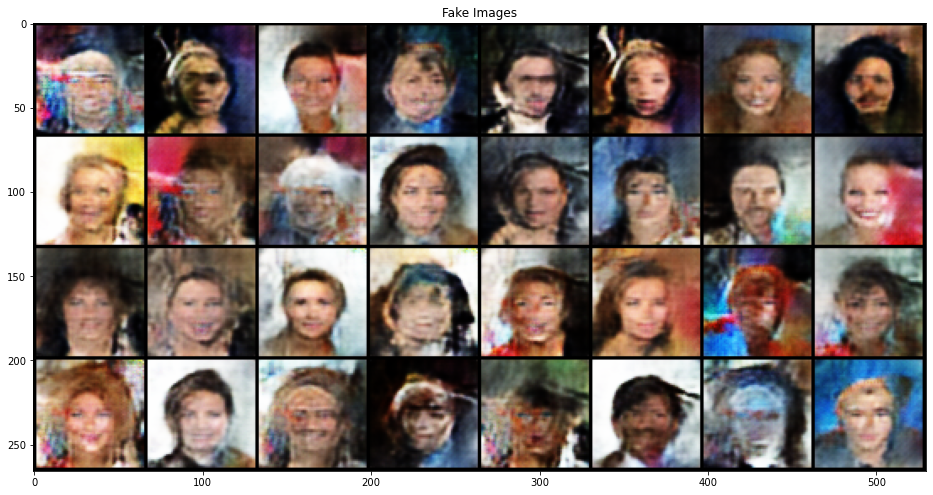

  0%|          | 0/3166 [00:00<?, ?it/s]

EPOCH 11 / 20
Running Generator Loss : 2.0499102063594705
Running Discriminator Loss : 0.3796356317839589


  0%|          | 0/3166 [00:00<?, ?it/s]

EPOCH 12 / 20
Running Generator Loss : 2.1122691527018422
Running Discriminator Loss : 0.37556151782156016


100%|██████████| 3166/3166 [14:51<00:00,  3.55it/s, d_loss=tensor(0.3502, device='cuda:0', grad_fn=<DivBackward0>), g_loss=tensor(2.7244, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward>)]


EPOCH 13 / 20
Running Generator Loss : 2.125221743774956
Running Discriminator Loss : 0.37046937663308144


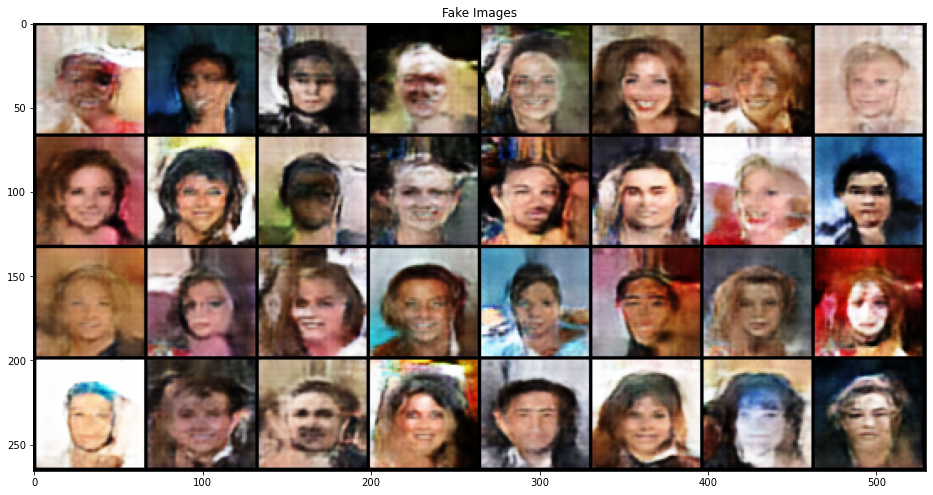

  0%|          | 0/3166 [00:00<?, ?it/s]

EPOCH 14 / 20
Running Generator Loss : 2.1287909209615283
Running Discriminator Loss : 0.36445281027203785


  0%|          | 0/3166 [00:00<?, ?it/s]

EPOCH 15 / 20
Running Generator Loss : 2.149174559251914
Running Discriminator Loss : 0.3603553108433267


100%|██████████| 3166/3166 [15:38<00:00,  3.37it/s, d_loss=tensor(0.3569, device='cuda:0', grad_fn=<DivBackward0>), g_loss=tensor(3.0397, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward>)]


EPOCH 16 / 20
Running Generator Loss : 2.139764070021376
Running Discriminator Loss : 0.35819282316363316


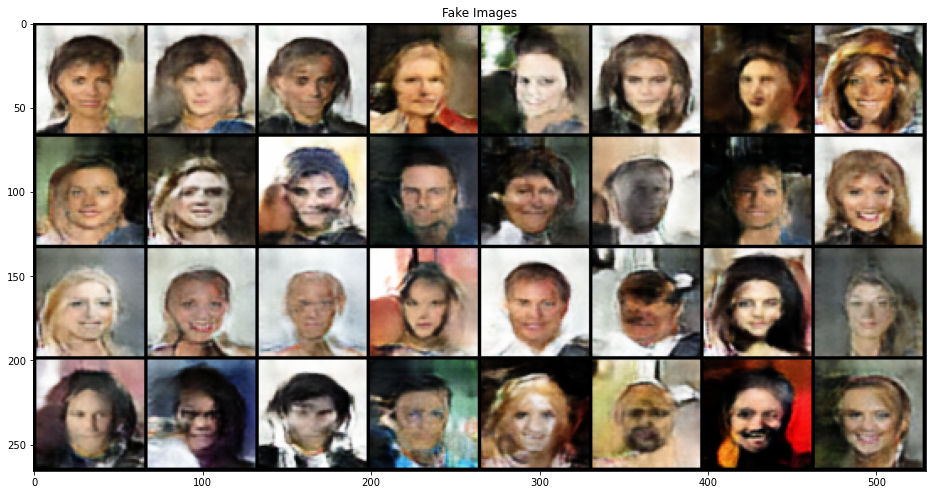

  0%|          | 0/3166 [00:00<?, ?it/s]

EPOCH 17 / 20
Running Generator Loss : 2.1407868174232414
Running Discriminator Loss : 0.3545884572755515


  0%|          | 0/3166 [00:00<?, ?it/s]

EPOCH 18 / 20
Running Generator Loss : 2.144037516562907
Running Discriminator Loss : 0.35179945868890045


100%|██████████| 3166/3166 [15:09<00:00,  3.48it/s, d_loss=tensor(0.3565, device='cuda:0', grad_fn=<DivBackward0>), g_loss=tensor(2.3031, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward>)]


EPOCH 19 / 20
Running Generator Loss : 2.143947872984507
Running Discriminator Loss : 0.35046755766763166


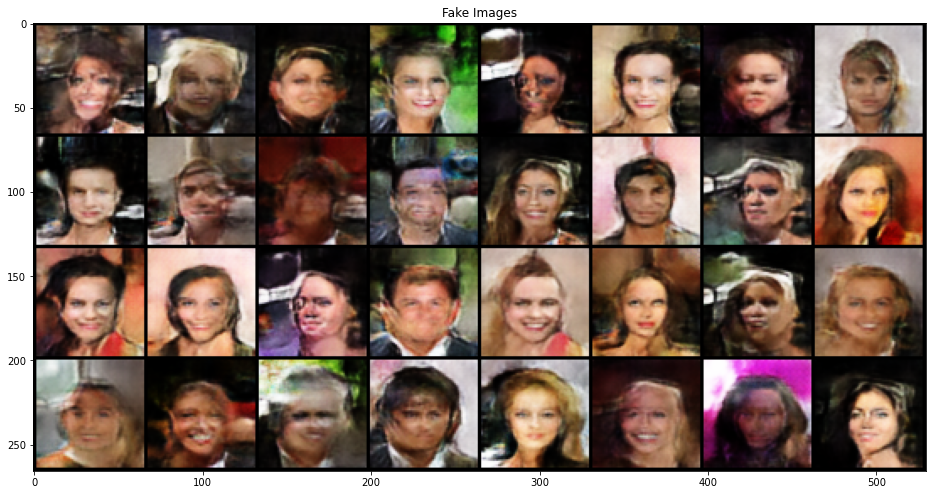

100%|██████████| 3166/3166 [14:01<00:00,  3.76it/s, d_loss=tensor(0.3394, device='cuda:0', grad_fn=<DivBackward0>), g_loss=tensor(1.9257, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward>)]

EPOCH 20 / 20
Running Generator Loss : 2.1328264801319987
Running Discriminator Loss : 0.34797707382667237


In [13]:
#Train

from tqdm import tqdm
scaler = torch.cuda.amp.GradScaler()
for epoch in range(NUM_EPOCHS):
    running_g_loss = 0
    running_d_loss =0
    gen_history = []
    disc_history = []
    g.train()
    d.train()
    loop = tqdm(train_loader)
    for idx, (real_image) in enumerate(loop):
        noise = torch.randn(real_image.size(0), z_dim,1,1).to(device)
        #Add decaying random noise
        decaying_noise = torch.randn(real_image.size(0),1,image_dim,image_dim).to(device)*(0.9**epoch)
        decaying_noise_ = torch.randn(real_image.size(0),1,image_dim,image_dim).to(device)*(0.9**epoch)
        real_image = (real_image).to(device)
        real_image = real_image + decaying_noise
        fake_image = g(noise)+decaying_noise_
        d_fake = d(fake_image).view(-1)
        d_real = d(real_image).view(-1)
        #forward pass
        #Swap the label for discriminator and generator
        disc_loss1 = criterion(d_real, torch.ones_like(d_real)*0.9)
        disc_loss2 = criterion(d_fake, torch.ones_like(d_fake)*0.1)
        disc_loss = (disc_loss1+disc_loss2)/2 
        
        #backward
        
        disc_opt.zero_grad() 
        scaler.scale(disc_loss).backward(retain_graph = True) #Need to make retain_graph as true if we are reusing computation
        scaler.step(disc_opt)
        scaler.update()
        loop.set_postfix(d_loss = disc_loss.item())
        
        out = d(fake_image).view(-1)
        gen_loss = criterion(out, torch.ones_like(out)*0.9)                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                       
        gen_opt.zero_grad()
        scaler.scale(gen_loss).backward()
        scaler.step(gen_opt)
        scaler.update()
        loop.set_postfix(g_loss = gen_loss, d_loss = disc_loss)
        
        running_g_loss += gen_loss.item()
        running_d_loss += disc_loss.item()
        gen_history.append(gen_loss.item())
        disc_history.append(disc_loss.item())
    
    print("EPOCH",epoch+1,"/",NUM_EPOCHS)
    print("Running Generator Loss :", running_g_loss/3166)
    print("Running Discriminator Loss :", running_d_loss/3166)
    g.eval()
    if (epoch%3 == 0):
        n = torch.randn(BATCH_SIZE, z_dim, 1, 1).to(device)
        f = g(n).cpu().detach()
        with torch.no_grad():
            plt.figure(figsize=(16,24))
            plt.title("Fake Images")
            img_grid = torchvision.utils.make_grid(f[0:32],normalize = True)
            plt.imshow(np.transpose(img_grid,(1,2,0)))
            plt.show()

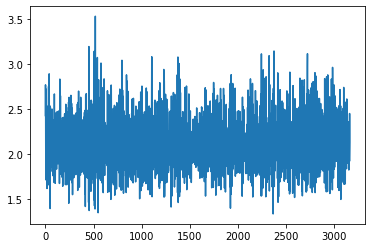

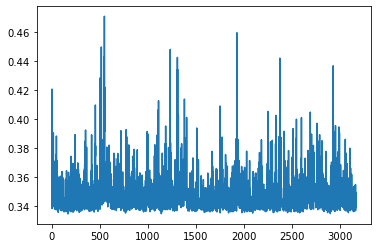

In [14]:
plt.plot(gen_history)
plt.show()
plt.plot(disc_history)
plt.show()

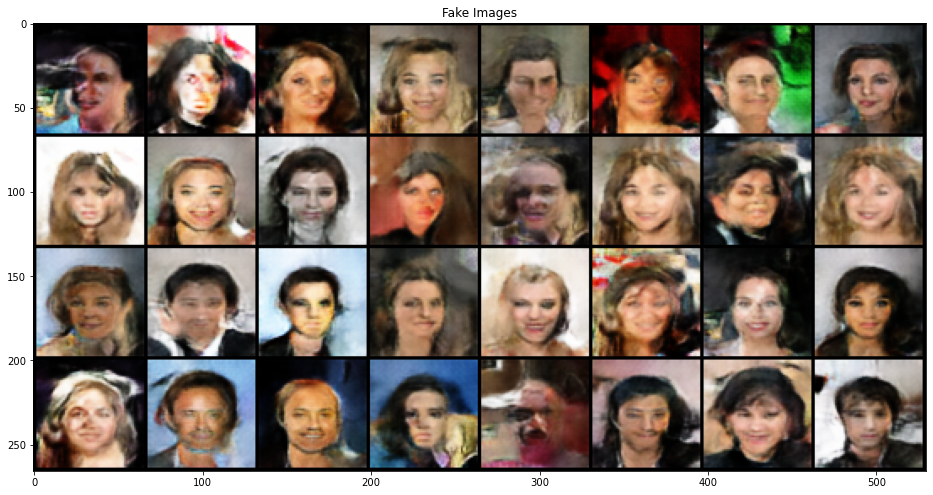

In [44]:
n = torch.randn(BATCH_SIZE, z_dim, 1, 1).to(device)
f = g(n).cpu().detach()
plt.figure(figsize=(16,24))
plt.title("Fake Images")
img_grid = torchvision.utils.make_grid(f[0:32],normalize = True)
plt.imshow(np.transpose(img_grid,(1,2,0)))

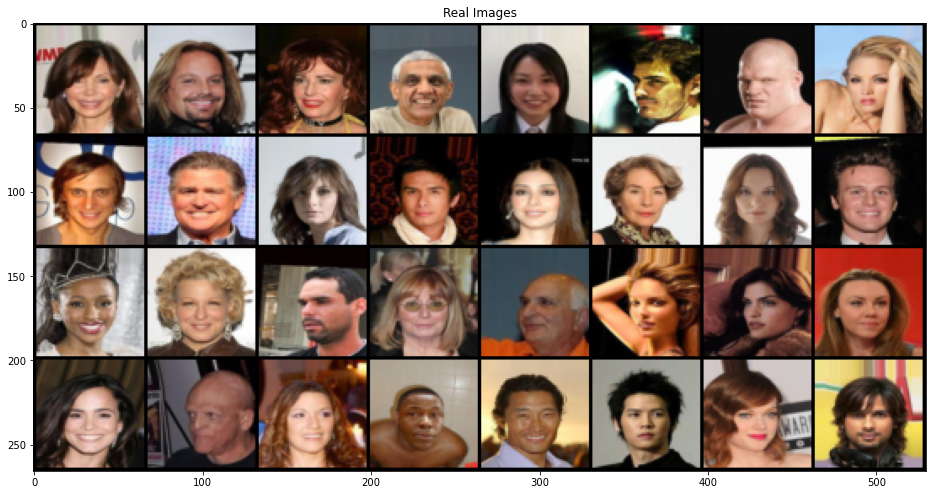

In [16]:
real = next(iter(train_loader))
img_grid = torchvision.utils.make_grid(real[0:32],normalize = True)
plt.figure(figsize=(16,24))
plt.title("Real Images")
plt.imshow(np.transpose(img_grid,(1,2,0)))


torch.Size([1, 128, 1, 1])
torch.Size([64, 128, 1, 1])
torch.Size([64, 3, 64, 64])


/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:10: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  # Remove the CWD from sys.path while we load stuff.
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:12: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  if sys.path[0] == '':


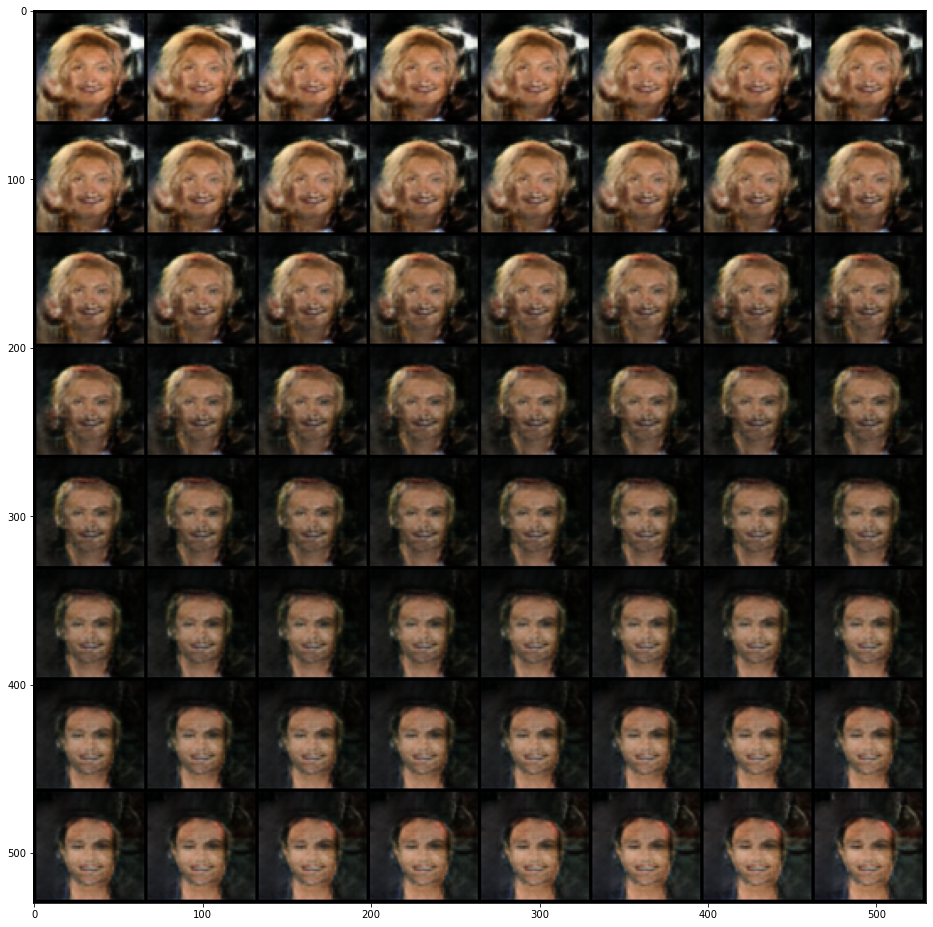

In [46]:
rnd = np.random.RandomState(5)
n_interpolation = 64
first_noise = torch.tensor(rnd.randn(1, z_dim,1,1))
second_noise = torch.tensor(rnd.randn(1, z_dim,1,1))
print(first_noise.shape)
#x = torch.ones_like(first_noise)*0.5
percent_first_noise = np.linspace(0, 1, n_interpolation)[:, None]
interpolation_noise = torch.zeros((n_interpolation,z_dim,1,1))
for i in range(n_interpolation):
    interpolation_noise[i] = torch.tensor(first_noise * percent_first_noise[i] + second_noise * (1 - percent_first_noise[i]))
print(interpolation_noise.shape)
ff = g(torch.tensor(interpolation_noise).type(torch.FloatTensor).to(device))
print(ff.shape)
ff = ff.cpu().detach()
plt.figure(figsize=(16,200))
img_grid = torchvision.utils.make_grid(ff,normalize = True)
plt.imshow(np.transpose(img_grid,(1,2,0)))

torch.Size([1, 128, 1, 1])
torch.Size([64, 128, 1, 1])
torch.Size([64, 3, 64, 64])


/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:10: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  # Remove the CWD from sys.path while we load stuff.
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:12: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  if sys.path[0] == '':


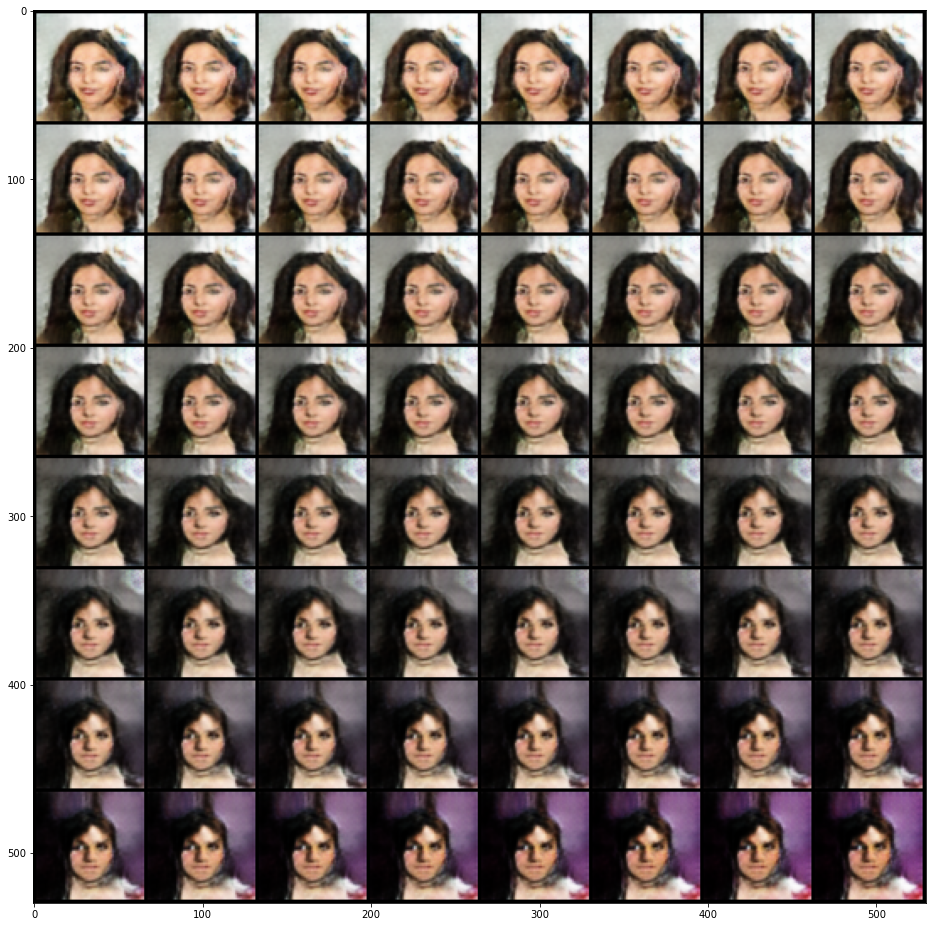

In [56]:
rnd = np.random.RandomState(17)
n_interpolation = 64
first_noise = torch.tensor(rnd.randn(1, z_dim,1,1))
second_noise = torch.tensor(rnd.randn(1, z_dim,1,1))
print(first_noise.shape)
#x = torch.ones_like(first_noise)*0.5
percent_first_noise = np.linspace(0, 1, n_interpolation)[:, None]
interpolation_noise = torch.zeros((n_interpolation,z_dim,1,1))
for i in range(n_interpolation):
    interpolation_noise[i] = torch.tensor(first_noise * percent_first_noise[i] + second_noise * (1 - percent_first_noise[i]))
print(interpolation_noise.shape)
ff = g(torch.tensor(interpolation_noise).type(torch.FloatTensor).to(device))
print(ff.shape)
ff = ff.cpu().detach()
plt.figure(figsize=(16,200))
img_grid = torchvision.utils.make_grid(ff,normalize = True)
plt.imshow(np.transpose(img_grid,(1,2,0)))

torch.Size([64, 128, 1, 1])
torch.Size([64, 3, 64, 64])


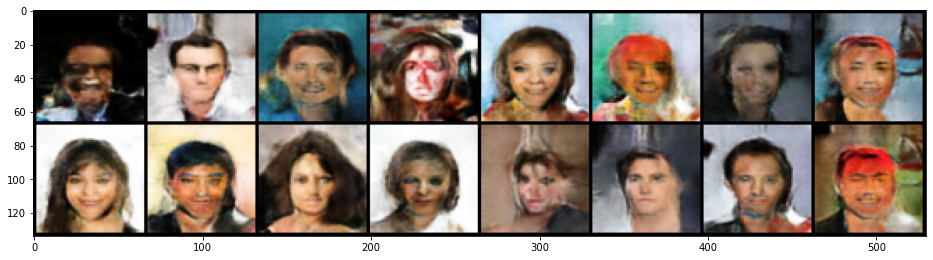

In [23]:
n1 = torch.randn(BATCH_SIZE, z_dim, 1, 1).to(device)
f1 = g(n1).cpu().detach()
plt.figure(figsize=(16,24))
print(n1.shape)
print(f1.shape)
img_grid = torchvision.utils.make_grid(f1[0:16],normalize = True)
plt.imshow(np.transpose(img_grid,(1,2,0)))

In [24]:
model_save_name = 'Faces_SNGAN_Generator.pt'
path = F".//{model_save_name}" 
torch.save(g.state_dict(), path)

In [25]:
model_save_name = 'Faces_SNGAN_Discriminator.pt'
path = F".//{model_save_name}" 
torch.save(d.state_dict(), path)